In [1]:
import phoebe
from phoebe import u, c

import matplotlib.pyplot as plt

import os
import sys
from pathlib import Path
baseModulePath = str(Path(os.getcwd()).parents[2].absolute())
if baseModulePath not in sys.path:
	sys.path.append(baseModulePath)

import importlib
import analisis.phoebe_model.utils as gen_utils
importlib.reload(gen_utils)

logger = phoebe.logger(clevel='WARNING')

In [2]:
# b = phoebe.load("../optimizers/bundle-saves/poro-aviles-invq/after_optimizers")
# b = phoebe.load("../optimizers/bundle-saves/iturbide-gaia-ztf-relative_norm/post-optimizers")
b = phoebe.load("../optimizers/bundle-saves/iturbide-gaia-ztf-relative_norm/post-optimizers")

# Increase Mesh Triangles

From preeliminary testing of sampling can see that some iterations failed due to the mesh not having high enough resolution.

In [3]:
print(b['ntriangles'])

Parameter: ntriangles@contact_envelope@phoebe01@compute
                       Qualifier: ntriangles
                     Description: Requested number of triangles (won't be exact).
                           Value: 4000
                  Constrained by: 
                      Constrains: None
                      Related to: None
                 Only visible if: mesh_method:marching,hierarchy.is_meshable:true



In [4]:
b.set_value(qualifier='ntriangles', value=5700)

# Renaming Datasets

Getting dataset names to play nice with plotting; math latex parser errors out with `lc_gaia_g_raw` due to 2 consecutive underscores (`_g` part probably).

In [5]:
originalDatasets = [d for d in b.datasets if d != 'mesh01' and 'Ztf' not in d]
originalDatasets

['lc_iturbide_norm',
 'lc_iturbide_aviles_norm',
 'lc_gaia_g_raw',
 'lc_gaia_rp_raw',
 'lc_gaia_bp_raw']

In [6]:
# using own iturbide flux sigmas for now
b.add_dataset('lc', dataset='lcIturbideAviles', overwrite=True, pblum_mode='dataset-scaled',
			  times=b.get_value(qualifier='times', dataset='lc_iturbide_aviles_norm', context='dataset'),
			  fluxes=b.get_value(qualifier='fluxes', dataset='lc_iturbide_aviles_norm', context='dataset'))
b.add_dataset('lc', dataset='lcIturbideFull', overwrite=True, pblum_mode='dataset-scaled',
			  times=b.get_value(qualifier='times', dataset='lc_iturbide_norm', context='dataset'),
			  fluxes=b.get_value(qualifier='fluxes', dataset='lc_iturbide_norm', context='dataset'),
			  sigmas=b.get_value(qualifier='sigmas', dataset='lc_iturbide_norm', context='dataset'))

b.add_dataset('lc', dataset='lcGaiaG', overwrite=True, passband='Gaia:G', 
			  times=b.get_value(qualifier='times', dataset='lc_gaia_g_raw', context='dataset'),
			  fluxes=b.get_value(qualifier='fluxes', dataset='lc_gaia_g_raw', context='dataset'),
			  sigmas=b.get_value(qualifier='sigmas', dataset='lc_gaia_g_raw', context='dataset'),
			  pblum_mode='component-coupled', pblum=b.get_value(qualifier='pblum', dataset='lc_gaia_g_raw'))
b.add_dataset('lc', dataset='lcGaiaRP', overwrite=True, passband='Gaia:RP',
			  times=b.get_value(qualifier='times', dataset='lc_gaia_rp_raw', context='dataset'),
			  fluxes=b.get_value(qualifier='fluxes', dataset='lc_gaia_rp_raw', context='dataset'),
			  sigmas=b.get_value(qualifier='sigmas', dataset='lc_gaia_rp_raw', context='dataset'),
			  pblum_mode='dataset-coupled', pblum_dataset='lcGaiaG')
b.add_dataset('lc', dataset='lcGaiaBP', overwrite=True, passband='Gaia:BP',
			  times=b.get_value(qualifier='times', dataset='lc_gaia_bp_raw', context='dataset'),
			  fluxes=b.get_value(qualifier='fluxes', dataset='lc_gaia_bp_raw', context='dataset'),
			  sigmas=b.get_value(qualifier='sigmas', dataset='lc_gaia_bp_raw', context='dataset'),
			  pblum_mode='dataset-coupled', pblum_dataset='lcGaiaG')

<ParameterSet: 47 parameters | contexts: compute, dataset, constraint, figure>

In [7]:
gaiaDatasets = [d for d in b.datasets if 'Gaia' in d]
iturbideDatasets = ['lcIturbideAviles', 'lcIturbideFull']
ztfDatasets = ['lcZtfG', 'lcZtfR']
trimmedZtfDatasets = ['lcZtfGTrimmed', 'lcZtfRTrimmed']
allDatasets = gaiaDatasets + iturbideDatasets + ztfDatasets
plotAllDatasetsGroups = [['lcIturbideAviles'], ['lcIturbideFull'], gaiaDatasets, ztfDatasets]

100%|██████████| 3677/3677 [20:20<00:00,  3.01it/s]
Fri, 16 Feb 2024 15:36 BUNDLE       WARNING dataset-scaling: adopting sigmas=0.0008344892206263245 for dataset='lcIturbideAviles'


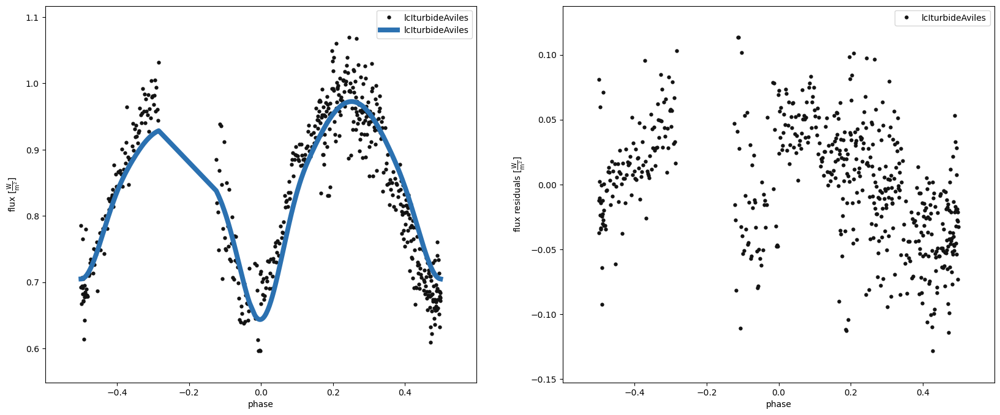

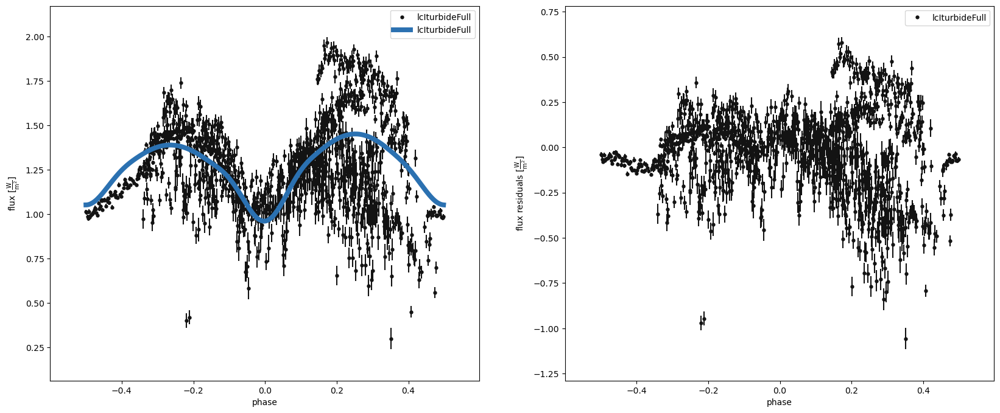

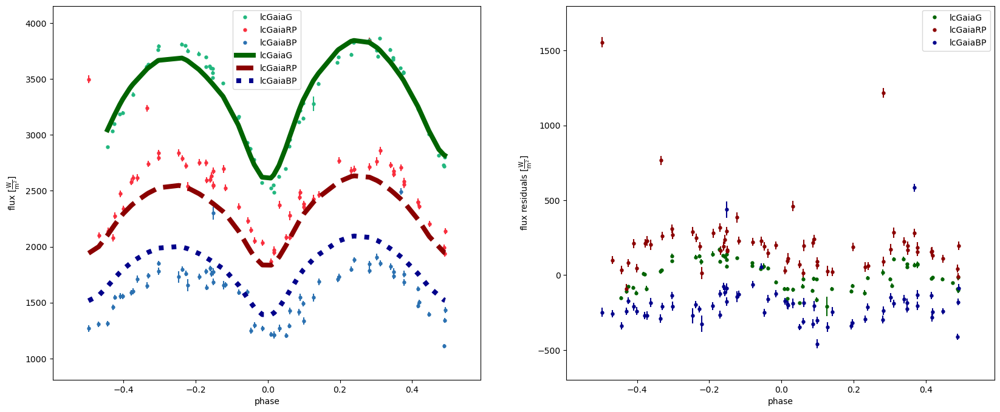

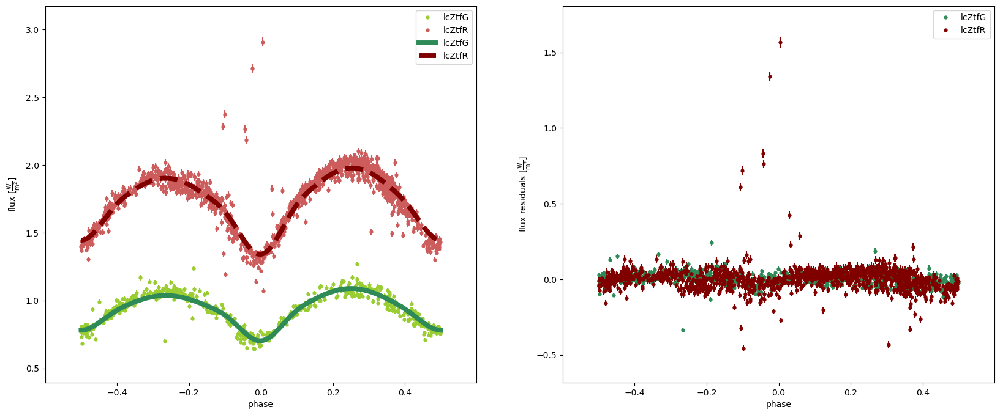

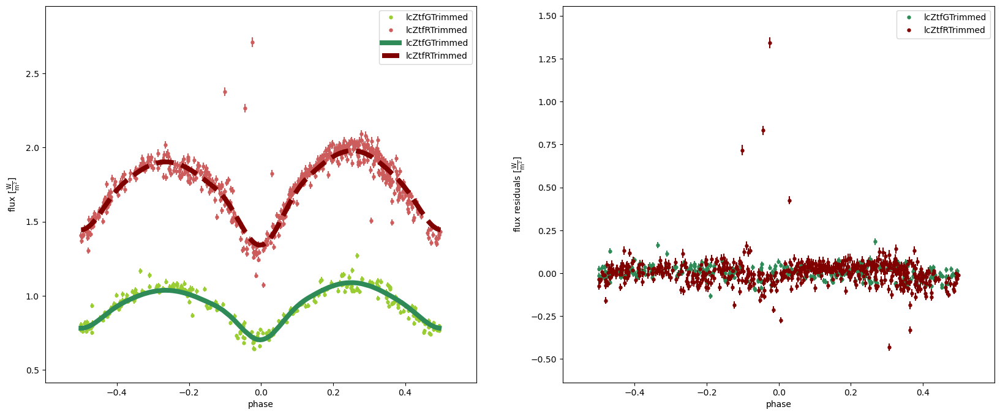

<Figure size 800x600 with 0 Axes>

In [8]:
gen_utils.abilitateDatasets(b, allDatasets + trimmedZtfDatasets)
b.run_compute(model='after_opt', overwrite=True)
gen_utils.plotModelResidualsFigsize(b, (20, 8), plotAllDatasetsGroups + [trimmedZtfDatasets], model='after_opt')
gen_utils.animateMesh(b, logger, model='after_opt')

In [9]:
for d in originalDatasets:
	b.remove_dataset(d)

In [10]:
b.datasets

['mesh01',
 'lcZtfG',
 'lcZtfR',
 'lcZtfGTrimmed',
 'lcZtfRTrimmed',
 'lcIturbideAviles',
 'lcIturbideFull',
 'lcGaiaG',
 'lcGaiaRP',
 'lcGaiaBP']

# Creating Uniform Boundary Distributions

Restricting sampler parameter space; not prescribing a shape to the parameter distribution, only interested in restricting sampler space to decrease compute 
requirements.

In [11]:
print(b.get_adjustable_parameters())

ParameterSet: 66 parameters
                  distance@system: 1.0 m
                    vgamma@system: 0.0 km / s
                        Av@system: 0.0
                        Rv@system: 3.1
           teff@primary@component: 4468.089709381677 K
        syncpar@primary@component: 1.0
      gravb_bol@primary@component: 0.32
   irrad_frac_refl_bol@primary...: 0.6
           mass@primary@component: 0.6306178532627956 solMass
      syncpar@secondary@component: 1.0
    gravb_bol@secondary@component: 0.32
   irrad_frac_refl_bol@seconda...: 0.6
          period@binary@component: 0.33356598071006005 d
            dpdt@binary@component: 0.0 s / yr
            per0@binary@component: 0.0 deg
          dperdt@binary@component: 0.0 deg / yr
             ecc@binary@component: 0.0
      t0_supconj@binary@component: -0.037542756559644994 d
            incl@binary@component: 66.54776777419643 deg
               q@binary@component: 1.8564781150410863
         long_an@binary@component: 0.0 deg
   abun@

In [12]:
print(b['secondary_spot'])

ParameterSet: 5 parameters
     colat@secondary_spot@feature: 87.45162763638874 deg
      long@secondary_spot@feature: 250.88311215143864 deg
    radius@secondary_spot@feature: 25.159232597955516 deg
   relteff@secondary_spot@feature: 0.8834424094447035
   enabled@secondary_spot@phoe...: True


In [26]:
print(b['mass'])
print(b['requiv'])
print(b['pot@contact_envelope'])
print(b['sma'])
print(b['fillout_factor'])
print(b['incl@binary'])

print("==========================================================")
print(b['gravb_bol@primary'])
print(b['abun'])

ParameterSet: 4 parameters
           mass@primary@component: 0.6306178532627956 solMass
C        mass@secondary@component: 1.170728243536571 solMass
                  mass@constraint: (39.478418 * ({sma@binary@component} ** 3.000000)) / ((({period@binary@component} ** 2.000000) * ((1.000000 / {q@binary@component}) + 1.000000)) * 2942.206217504419328179210424423218)
   mass@poro_porb_bounds@distr...: <distl.uniform low=1.0683323801509998 high=1.1763674300009999 unit=solMass label=mass@primary label_latex=$M_\mathrm{ primary }$>
ParameterSet: 4 parameters
C        requiv@primary@component: 0.8115322366958401 solRad
C      requiv@secondary@component: 1.0782664973152796 solRad
        requiv@primary@constraint: pot_to_requiv_contact({pot@contact_envelope@component}, {q@binary@component}, {sma@binary@component}, 1)
      requiv@secondary@constraint: pot_to_requiv_contact({pot@contact_envelope@component}, {q@binary@component}, {sma@binary@component}, 2)
ParameterSet: 2 parameters
C  pot@con

In [14]:
b.add_distribution({
	'teff@primary': phoebe.uniform_around(250),
	'teffratio': phoebe.uniform_around(0.1),
	'fillout_factor': phoebe.uniform(0.01, 0.15), # avoiding ff <= 0, since this is not valid for CBS
	'incl@binary': phoebe.uniform_around(10),
	'q': phoebe.uniform_around(0.20)	
}, distribution='bounds_around', overwrite_all=True)

b.add_distribution({
	'colat@secondary_spot': phoebe.uniform_around(5),
	'long@secondary_spot': phoebe.uniform_around(5),
	'radius@secondary_spot': phoebe.uniform_around(5),
	'relteff@secondary_spot': phoebe.uniform_around(0.1)
}, distribution='bounds_secondary_spot', overwrite_all=True)

b.add_distribution({
	'pblum@primary@lcGaiaG': phoebe.uniform_around(5000)
}, distribution='bounds_pblum_gaia_g', overwrite_all=True)

b.add_distribution({
	'pblum@primary@lcZtfG': phoebe.uniform_around(2)
}, distribution='bounds_pblum_ztf_g', overwrite_all=True)

b.add_distribution({
	'pblum@primary@lcZtfGTrimmed': phoebe.uniform_around(2)
}, distribution='bounds_pblum_ztf_g_trimmed', overwrite_all=True)

<ParameterSet: 1 parameters>

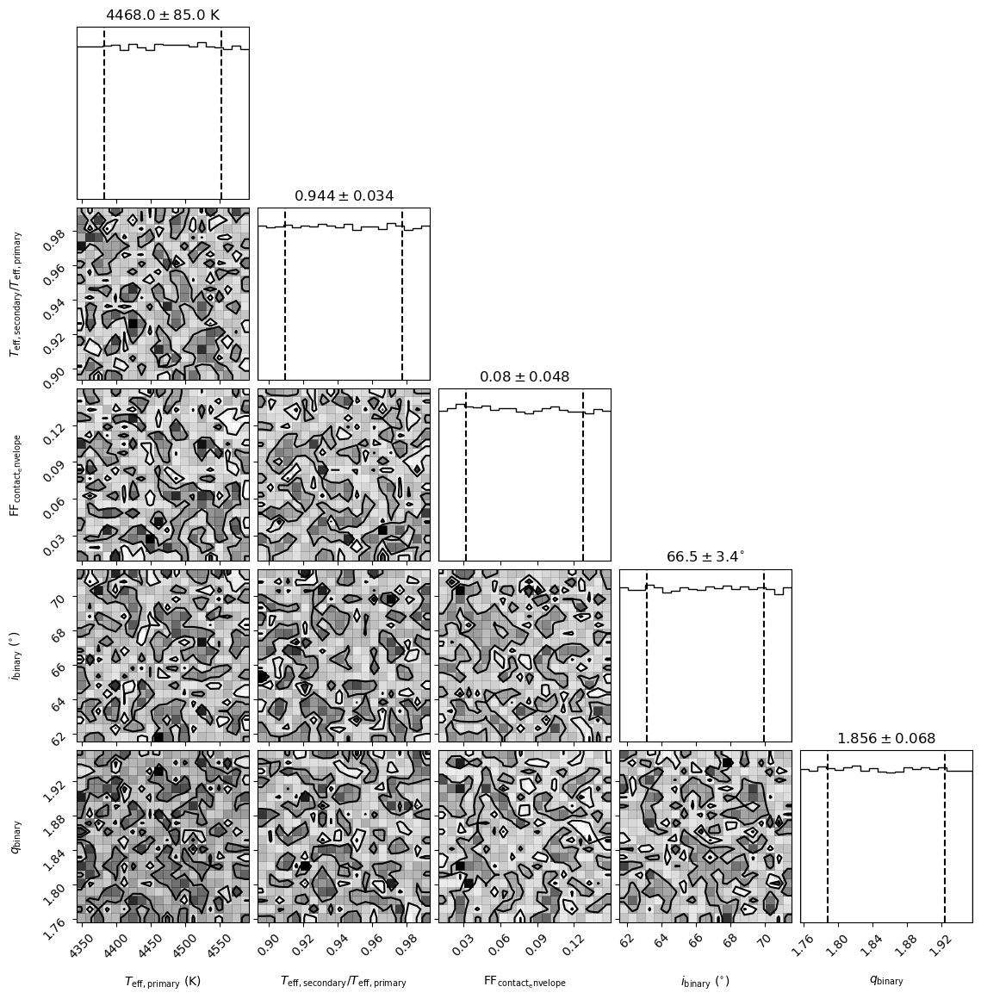

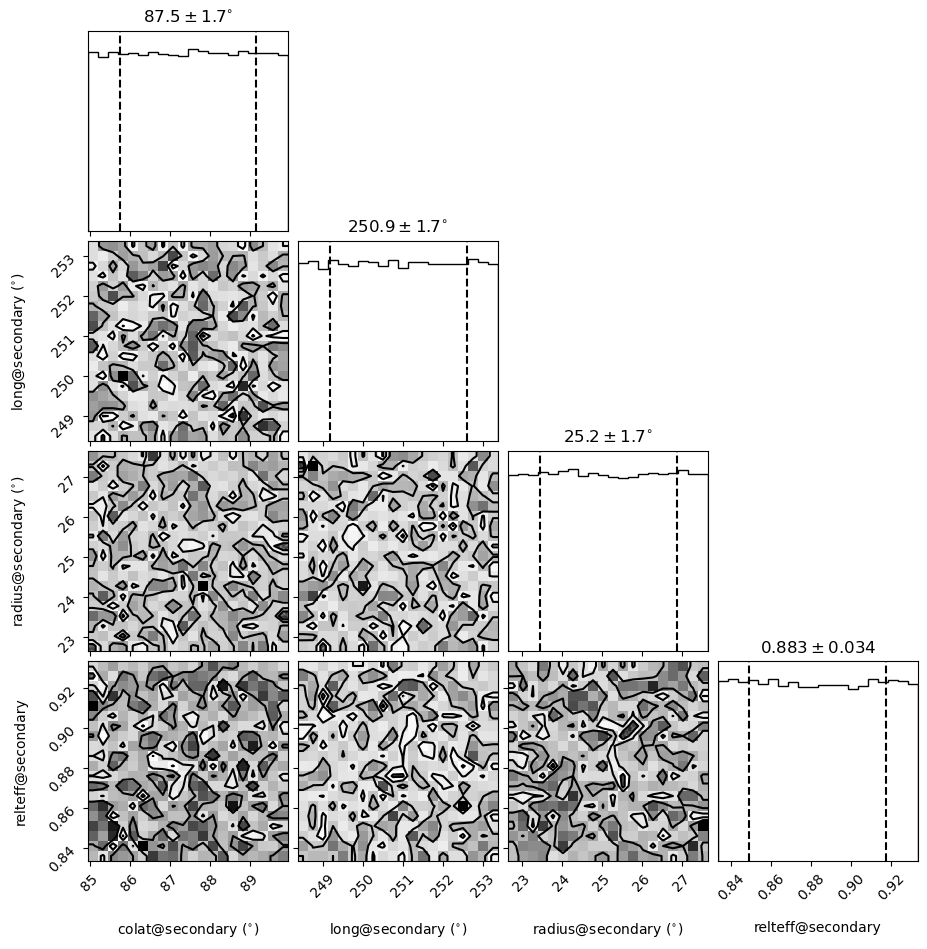

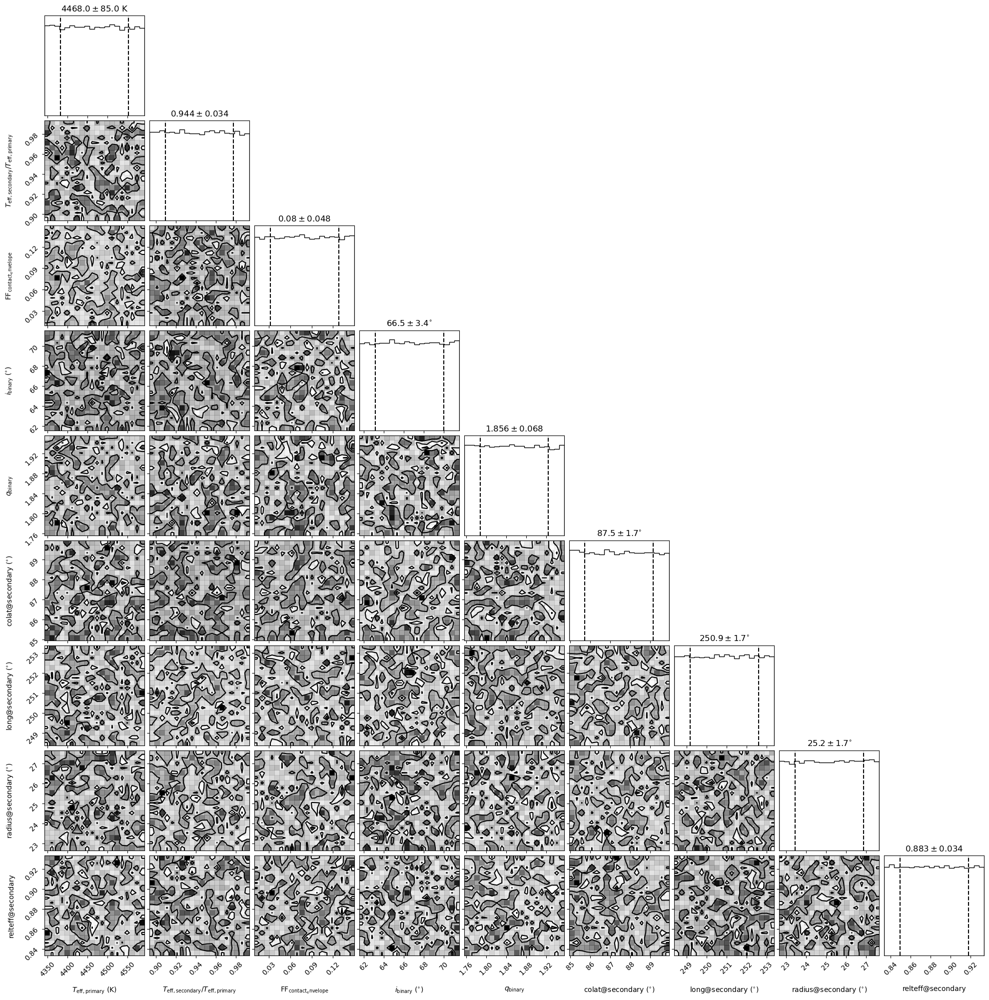

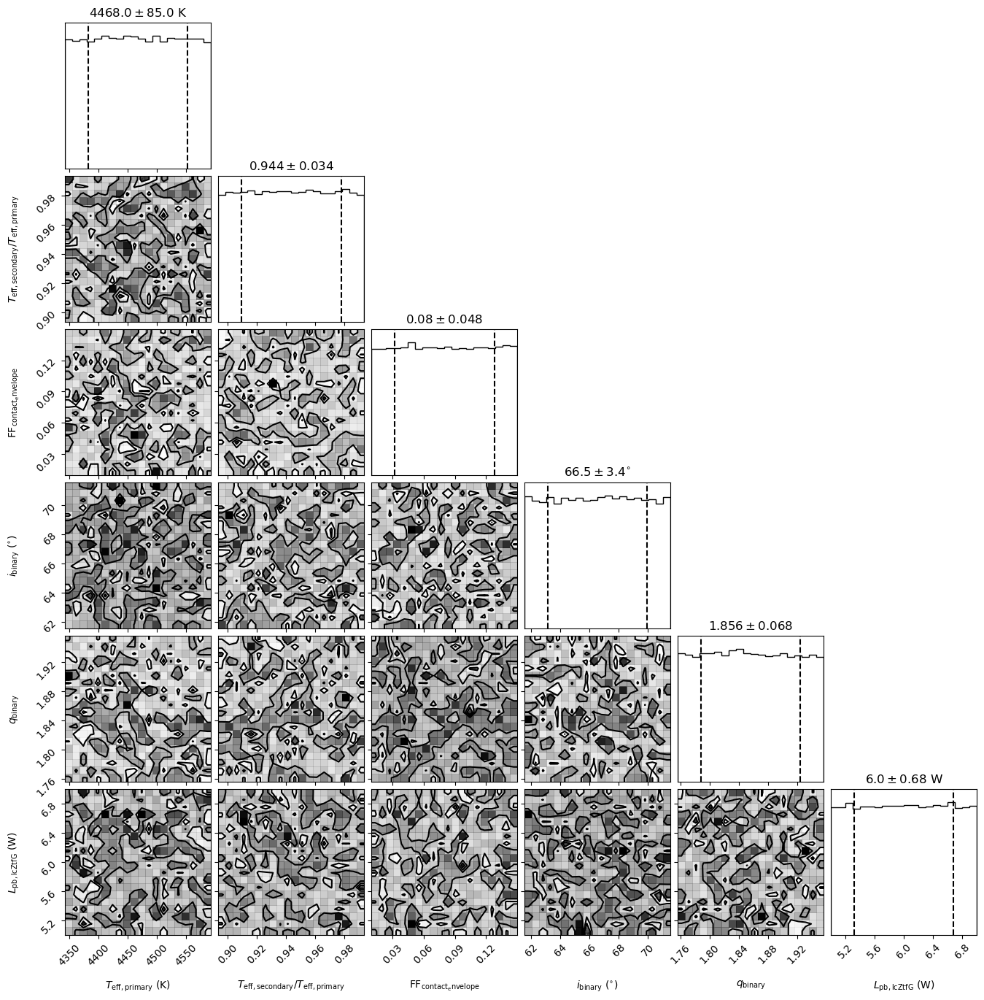

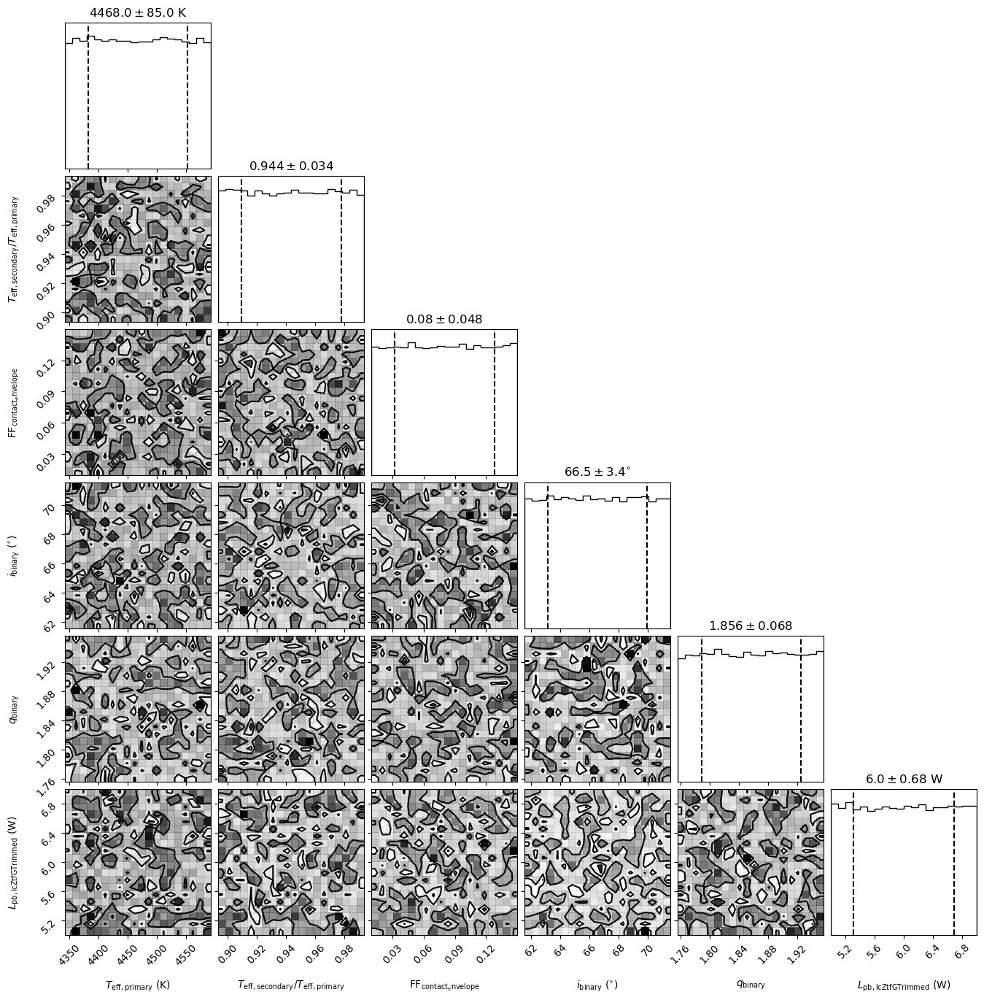

In [15]:
_ = b.plot_distribution_collection('bounds_around', show=True)
_ = b.plot_distribution_collection('bounds_secondary_spot', show=True)
_ = b.plot_distribution_collection(['bounds_around', 'bounds_secondary_spot'], show=True)
_ = b.plot_distribution_collection(['bounds_around', 'bounds_pblum_ztf_g'], show=True)
_ = b.plot_distribution_collection(['bounds_around', 'bounds_pblum_ztf_g_trimmed'], show=True)

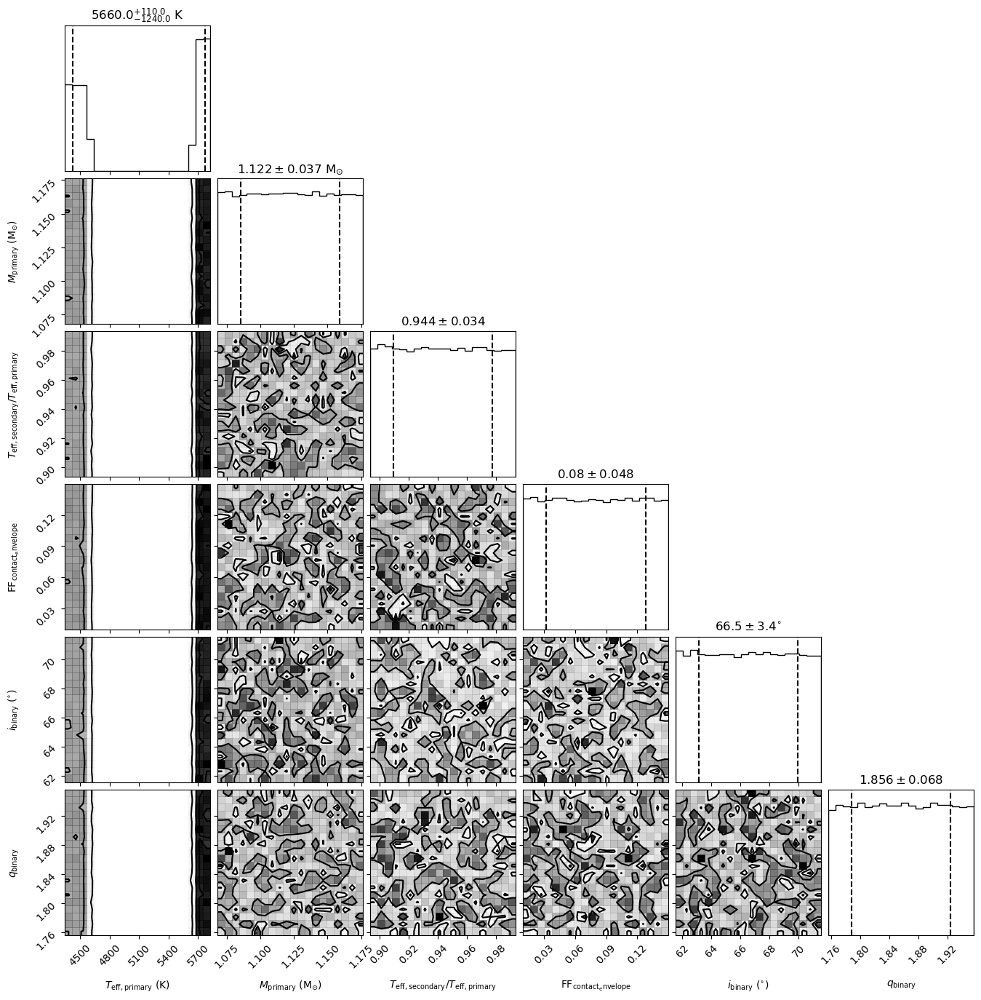

In [16]:
_ = b.plot_distribution_collection(['poro_porb_bounds', 'bounds_around'], combine='or', show=True)

# Sampled Compute Models

**SKIPPING**; whole script fails on external server when attempting to compute model with OoB parameters. Haven't found an option in documentation to ignore/skip
these errors.

In [15]:
%%script echo "skipping; for compute that falls out of physical bounds, compute fails"
gen_utils.abilitateDatasets(b, allDatasets)
gen_utils.exportCompute(b, model='from_bounds_around', datasets=allDatasets, subfolder='aviles-invq', 
						sample_from='bounds_around', sample_num=50)
gen_utils.exportCompute(b, model='from_ba_pbgaia', datasets=gaiaDatasets, subfolder='aviles-invq',
						sample_from=['bounds_around', 'bounds_pblum_gaia_g'], sample_num=50)

skipping; for compute that falls out of physical bounds, compute fails


# Helper Functions

In [17]:
def exportSampler(b: phoebe.Bundle, sampler_solver: str, datasets: list[str], subfolder: str = None, **solver_kwargs) -> None:
	exportFolder = "external-jobs"
	if subfolder is not None:
		exportFolder = os.path.join(exportFolder, subfolder)
	os.makedirs(exportFolder, exist_ok=True)

	prevEnabledDatasets = [d for d in b.datasets if b.get_value(qualifier='enabled', dataset=d)]
	gen_utils.abilitateDatasets(b, datasets, False)
	try:
		b.add_solver('sampler.emcee', solver=sampler_solver, overwrite=True, **solver_kwargs)
		exportFilePath = os.path.join(exportFolder, f"{sampler_solver}.py")
		resultsFilePath = os.path.join("results", sampler_solver)
		fname, out_fname = b.export_solver(script_fname=exportFilePath, out_fname=resultsFilePath, solver=sampler_solver, solution=f"{sampler_solver}_solution")
		print(sampler_solver, fname, out_fname, sep=" | ")
	finally:
		gen_utils.abilitateDatasets(b, prevEnabledDatasets)

def continueSampler(b: phoebe.Bundle, solver: str, prev_solution: str, continuation_label: str, datasets: list[str], subfolder: str = None, **solver_kwargs) -> None:
	exportFolder = "external-jobs"
	if subfolder is not None:
		exportFolder = os.path.join(exportFolder, subfolder)
	os.makedirs(exportFolder, exist_ok=True)

	prevEnabledDatasets = [d for d in b.datasets if b.get_value(qualifier='enabled', dataset=d)]
	gen_utils.abilitateDatasets(b, datasets, False)

	try:
		b.set_value(qualifier='continue_from', solver=solver, value=prev_solution)
		exportFilePath = os.path.join(exportFolder, f"{continuation_label}.py")
		resultsFilePath = os.path.join("results", f"{continuation_label}_solution")
		fname, out_fname = b.export_solver(script_fname=exportFilePath, out_fname=resultsFilePath, solver=solver, solution=f"{continuation_label}_solution", 
									 continue_from=f"{solver}_solution", use_server='none', **solver_kwargs)
		print(solver, fname, out_fname, sep=" | ")
	finally:
		gen_utils.abilitateDatasets(b, prevEnabledDatasets)

def plotSamplerAcceptanceFractions(b: phoebe.Bundle, sampler_solution: str) -> None:
	nwalkers = b.get_value(qualifier='nwalkers', solution=sampler_solution)

	plt.figure(figsize=(15, 4))
	walkersIds = list(map(lambda wid: str(wid), range(0, nwalkers)))
	plt.bar(x=walkersIds, height=b.get_value(qualifier='acceptance_fractions', solution=sampler_solution))
	plt.ylim(0, 1)
	plt.xlim(-1, nwalkers + 1)

	plt.fill_between(list(range(-1, len(walkersIds) + 1)), 0.4, 0.8, color='goldenrod', alpha=0.4, label="Desired range")
	plt.title(f"{sampler_solution} Acceptance Fractions")
	plt.legend()

# Iturbide Sampling

In [17]:
%%script echo "skipping; outdated samples"

exportSampler(b, 'mcmc_iturbide_full', subfolder='iturbide-gaia-ztf-relative_norm', datasets=['lcIturbideFull'],
			  init_from=['bounds_around', 'bounds_pblum_full_iturbide'], nwalkers=32, niters=100, progress_every_niters=10)
print(b['mcmc_iturbide_full'])

skipping; outdated samples


In [18]:
%%script echo "skipping; outdated samples"

b.import_solution(fname="./external-jobs/aviles-invq/results/mcmc_iturbide_full", overwrite=True)
b.plot(solution='mcmc_iturbide_full_solution', style='lnprobability', burnin=0, thin=1, show=True)
b.plot(solution='mcmc_iturbide_full_solution', style='lnprobability', burnin=50, thin=1, show=True)

skipping; outdated samples


In [19]:
%%script echo "skipping; outdated samples"
b.plot(solution='mcmc_iturbide_full_solution', style='corner', burnin=0, thin=1, show=True)

skipping; outdated samples


In [20]:
%%script echo "skipping; outdated samples"
b.plot(solution='mcmc_iturbide_full_solution', style='trace', burnin=0, thin=1, show=True)

skipping; outdated samples


In [21]:
%%script echo "skipping; outdated samples"

b['mcmc_iturbide_full_solution'].qualifiers

skipping; outdated samples


In [22]:
%%script echo "skipping; outdated samples"

print(b['mcmc_iturbide_full_solution@autocorr_times'])

plotSamplerAcceptanceFractions(b, 'mcmc_iturbide_full_solution')

skipping; outdated samples


In [23]:
%%script echo "skipping; already ran"

# continue sampling from previous run to run a total of 800 iterations
continueSampler(b, "mcmc_iturbide_full", "mcmc_iturbide_full_round2", datasets=['lcIturbideFull'], subfolder="aviles-invq", niters=700)

skipping; already ran


# Gaia Sampling

In [21]:
exportSampler(b, 'mcmc_gaia', subfolder='iturbide-gaia-ztf-relative_norm', datasets=gaiaDatasets,
			  init_from=['bounds_around'], nwalkers=32, niters=1000, progress_every_niters=10)
print(b['mcmc_gaia'])

Wed, 31 Jan 2024 12:04 BUNDLE       WARNING 'use_mpi' not a recognized kwarg


mcmc_gaia | external-jobs/iturbide-gaia-ztf-relative_norm/mcmc_gaia.py | results/mcmc_gaia
ParameterSet: 15 parameters
        comments@mcmc_gaia@solver: 
      use_server@mcmc_gaia@solver: compute
         compute@mcmc_gaia@solver: phoebe01
   continue_from@mcmc_gaia@solver: None
       init_from@mcmc_gaia@solver: ['bounds_around']
   init_from_combine@mcmc_gaia...: first
   init_from_requires@mcmc_gai...: ['limits', 'priors']
          priors@mcmc_gaia@solver: []
        nwalkers@mcmc_gaia@solver: 32
          niters@mcmc_gaia@solver: 1000
   burnin_factor@mcmc_gaia@solver: 2.0
     thin_factor@mcmc_gaia@solver: 0.0
    nlags_factor@mcmc_gaia@solver: 3.0
   progress_every_niters@mcmc_...: 10
   expose_failed@mcmc_gaia@solver: True


In [26]:
# b.import_solution(fname="./external-jobs/aviles-invq/results/mcmc_gaia", overwrite=True)
b.import_solution(fname="./external-jobs/iturbide-gaia-ztf-relative_norm/results/mcmc_gaia", overwrite=True)

Mon, 15 Jan 2024 15:35 BUNDLE       WARNING not all uniqueids in fitted_uniqueids@mcmc_gaia_solution@solution are still valid.  Falling back on twigs.  Save and load same bundle to prevent this extra cost.


<ParameterSet: 23 parameters | qualifiers: adopt_parameters, burnin, distributions_bins, nlags, acceptance_fractions, nwalkers, thin, adopt_values, failed_samples, lnprob_cutoff, comments, adopt_distributions, fitted_twigs, lnprobabilities, distributions_convert, fitted_units, progress, imported_job, fitted_uniqueids, autocorr_times, wrap_central_values, niters, samples>

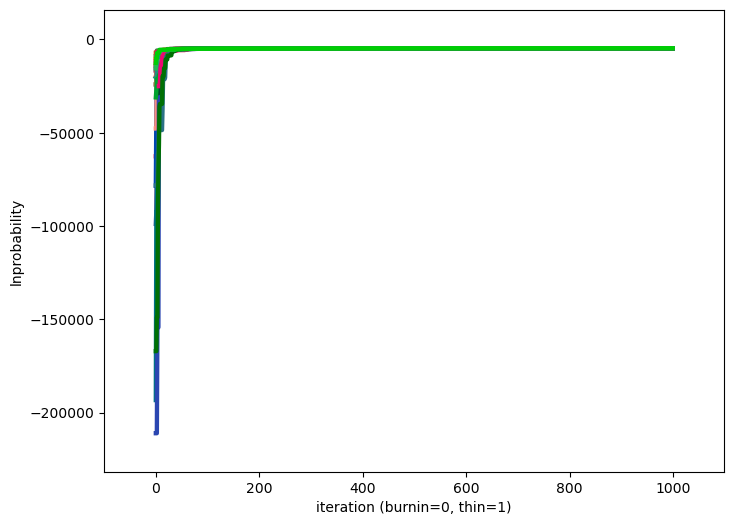

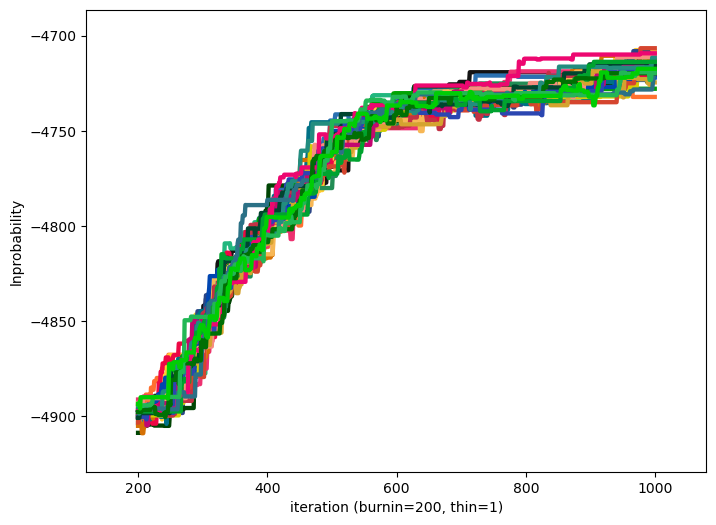

(<autofig.figure.Figure | 1 axes | 30 call(s)>,
 <Figure size 800x600 with 1 Axes>)

In [29]:
b.plot(solution='mcmc_gaia_solution', style='lnprobability', burnin=0, thin=1, show=True)
b.plot(solution='mcmc_gaia_solution', style='lnprobability', burnin=200, thin=1, show=True)

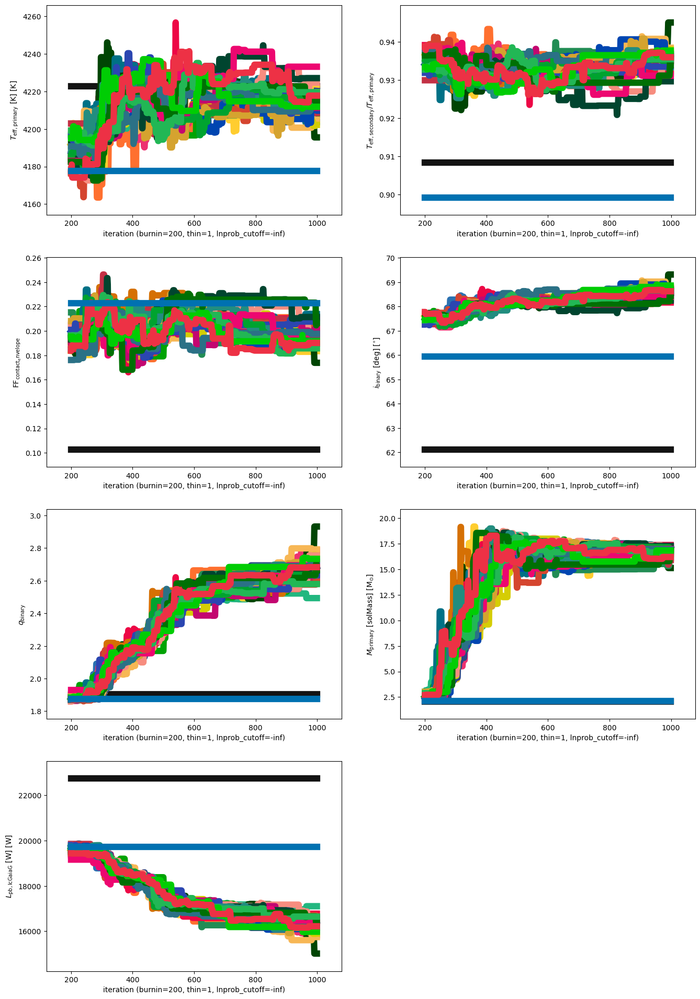

(<autofig.figure.Figure | 7 axes | 224 call(s)>,
 <Figure size 1600x2400 with 7 Axes>)

In [30]:
b.plot(solution='mcmc_gaia_solution', style='trace', burnin=200, thin=1, show=True)

In [31]:
print(b['pblum'])

ParameterSet: 8 parameters
     pblum@primary@lcZtfG@dataset: 5.846833829621264 W
   pblum@primary@lcIturbideAvi...: 5.341167705339014 W
   pblum@primary@lcIturbideFul...: 7.793466091892394 W
    pblum@primary@lcGaiaG@dataset: 20266.27584324061 W
   pblum@lcIturbideAviles@boun...: <distl.uniform_around width=2.0 value=5.341167705339014 unit=W frac=False>
   pblum@lcIturbideFull@bounds...: <distl.uniform_around width=3.0 value=7.793466091892394 unit=W frac=False>
   pblum@lcGaiaG@bounds_pblum_...: <distl.uniform_around width=5000.0 value=20266.27584324061 unit=W frac=False>
   pblum@lcZtfG@bounds_pblum_z...: <distl.uniform_around width=2.0 value=5.846833829621264 unit=W frac=False>


(None, <Figure size 1600x1600 with 49 Axes>)

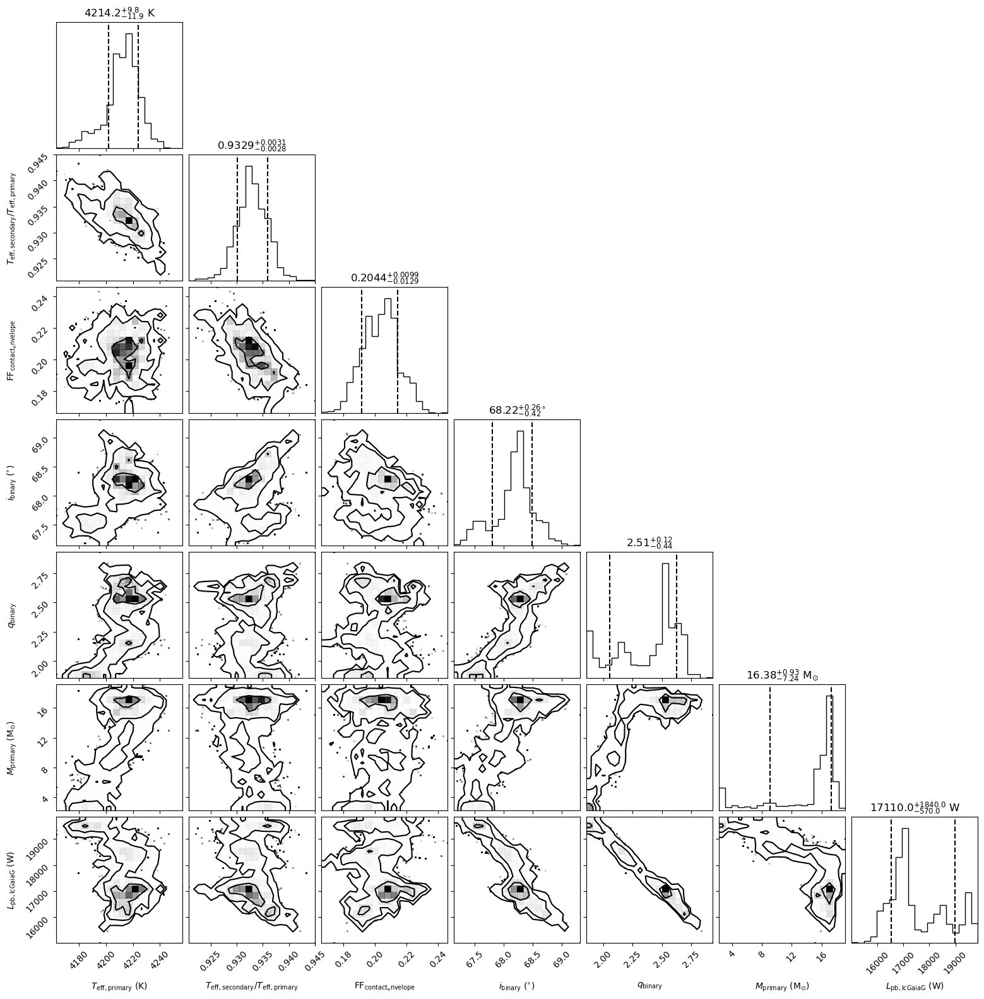

In [33]:
# print(b.filter(['incl@binary', 'teffratio', 'teff@primary', 'mass@primary', 'fillout_factor', 'q', 'pblum@primary@lcGaiaG']))
b.plot(solution='mcmc_gaia_solution', style='corner', burnin=200, thin=1, show=True)

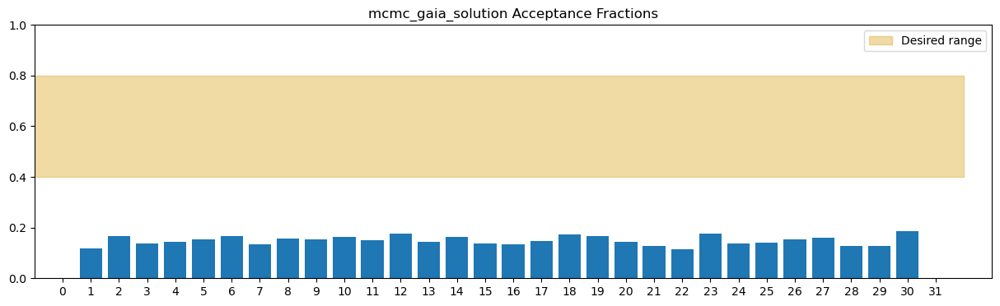

In [34]:
plotSamplerAcceptanceFractions(b, 'mcmc_gaia_solution')

In [30]:
b.solvers

['lcperiod_iturbide_auto',
 'lcperiod_iturbide_manual',
 'ebai_knn',
 'ebai_knn_lc_iturbide',
 'ebai_knn_lc_gaia_g',
 'ebai_knn_lc_gaia_rp',
 'ebai_knn_lc_gaia_bp',
 'ebai_knn_gaia',
 'ebai_knn_lc_iturbide_raw',
 'ebai_knn_lc_gaia_g_raw',
 'ebai_knn_lc_gaia_rp_raw',
 'ebai_knn_lc_gaia_bp_raw',
 'ebai_knn_raw',
 'ebai_knn_raw_gaia',
 'opt_teffr_ff',
 'opt_init_pbgaia',
 'opt_tprim_tratio_pbgaia',
 'opt_pb_iturbide_aviles',
 'opt_pb_iturbide_full',
 'opt_period_t0',
 'opt_q',
 'opt_q_incl',
 'opt_incl',
 'mcmc_iturbide_full',
 'mcmc_gaia']

In [31]:
# TODO: run once DE optimizer on server finishes
continueSampler(b, solver='mcmc_gaia', continuation_label="mcmc_gaia_round2", datasets=gaiaDatasets, subfolder="aviles-invq", niters=1500)

mcmc_gaia | external-jobs/aviles-invq/mcmc_gaia_round2.py | results/mcmc_gaia_round2_solution


## Modifying the MCMC sampler

Previously using 32 walkers to explore parameter space; some of the walkers didn't budge from their initial positions for certain parameters. Thinking
this might be due to using 2x walkers than there are CPUs in the server (8c-16t CPU). Adopting distributions and re-running with only 16 walkers.

In [42]:
b.adopt_solution(solution='mcmc_gaia_solution', adopt_distributions=True, distribution='mcmc_gaia_dist')

<ParameterSet: 14 parameters | contexts: distribution, dataset, component>

In [45]:
print(b['teff']) # confirmed that distribution is present in "mcmc_gaia_dist"

ParameterSet: 6 parameters
           teff@primary@component: 4029.9091072942847 K
C        teff@secondary@component: 3755.810839232623 K
                  teff@constraint: {teffratio@binary@component} * {teff@primary@component}
   teff@poro_porb_bounds@distr...: <distl.uniform low=5663.112795884727 high=5826.126240382796 unit=K label=teff@primary label_latex=$T_{ \mathrm{ eff }, \mathrm{ primary } }$>
   teff@bounds_around@distribu...: <distl.uniform_around width=500.0 value=4029.9091072942847 unit=K frac=False>
   teff@mcmc_gaia_dist@distrib...: <distl.mvsamplesslice dimension=0 samples=[[4.02702668e+03 1.03507423e+00 1.33341214e-01 ... 3.80830193e-01
  1.01924541e+00 3.20191592e+04]
 [4.20380409e+03 9.76833471e-01 2.11559746e-01 ... 3.00799387e-01
  8.57157218e-01 3.57262313e+04]
 [4.13849110e+03 9.63674154e-01 1.50081865e-01 ... 3.05682594e-01
  9.76147972e-01 3.52706338e+04]
 ...
 [4.03117227e+03 9.30758522e-01 6.55215138e-01 ... 1.85371074e-01
  2.30387625e+00 3.67282170e+04]
 [4

In [46]:
exportSampler(b, 'mcmc_gaia16', subfolder='aviles-invq', datasets=gaiaDatasets,
			  init_from=['mcmc_gaia_dist', 'bounds_around', 'bounds_pblum_gaia_g'], nwalkers=16, niters=1000, progress_every_niters=10, priors_combine='or')

Thu, 16 Nov 2023 16:37 BUNDLE       WARNING ignoring distribution on teff@primary@star@component with distribution='bounds_around' as distribution existed on an earlier distribution which takes precedence.
Thu, 16 Nov 2023 16:37 BUNDLE       WARNING ignoring distribution on teffratio@binary@orbit@component with distribution='bounds_around' as distribution existed on an earlier distribution which takes precedence.
Thu, 16 Nov 2023 16:37 BUNDLE       WARNING ignoring distribution on fillout_factor@contact_envelope@envelope@component with distribution='bounds_around' as distribution existed on an earlier distribution which takes precedence.
Thu, 16 Nov 2023 16:37 BUNDLE       WARNING ignoring distribution on incl@binary@orbit@component with distribution='bounds_around' as distribution existed on an earlier distribution which takes precedence.
Thu, 16 Nov 2023 16:37 BUNDLE       WARNING ignoring distribution on q@binary@orbit@component with distribution='bounds_around' as distribution exis

mcmc_gaia16 | external-jobs/aviles-invq/mcmc_gaia16.py | results/mcmc_gaia16


In [47]:
print(b['period'])

ParameterSet: 7 parameters
C        period@primary@component: 0.33354138280951534 d
C      period@secondary@component: 0.33354138280951534 d
          period@binary@component: 0.33354138280951534 d
        period@primary@constraint: {period@binary@component} / {syncpar@primary@component}
      period@secondary@constraint: {period@binary@component} / {syncpar@secondary@component}
R  period@lcperiod_iturbide_au...: [0.00132994
 0.00136319
 0.00139644
 ...
 0.49666701
 0.49670026
 0.49673351] d
R  period@lcperiod_iturbide_ma...: [7.99991321e+00
 7.99982642e+00
 7.99973963e+00
 ...
 1.17358188e-03
 1.08679094e-03
 1.00000000e-03] d


# ZTF Sampling

In [18]:
exportSampler(b, sampler_solver='mcmc_ztf', subfolder='iturbide-gaia-ztf-relative_norm', datasets=ztfDatasets, 
			  	init_from=['bounds_around'], nwalkers=32, niters=1000, progress_every_niters=10)
print(b['mcmc_ztf'])

mcmc_ztf | external-jobs/iturbide-gaia-ztf-relative_norm/mcmc_ztf.py | results/mcmc_ztf
ParameterSet: 15 parameters
         comments@mcmc_ztf@solver: 
       use_server@mcmc_ztf@solver: compute
          compute@mcmc_ztf@solver: phoebe01
    continue_from@mcmc_ztf@solver: None
        init_from@mcmc_ztf@solver: ['bounds_around']
   init_from_combine@mcmc_ztf@...: first
   init_from_requires@mcmc_ztf...: ['limits', 'priors']
           priors@mcmc_ztf@solver: []
         nwalkers@mcmc_ztf@solver: 32
           niters@mcmc_ztf@solver: 1000
    burnin_factor@mcmc_ztf@solver: 2.0
      thin_factor@mcmc_ztf@solver: 0.0
     nlags_factor@mcmc_ztf@solver: 3.0
   progress_every_niters@mcmc_...: 10
    expose_failed@mcmc_ztf@solver: True


## Trimmed Datasets

Utilizing every other data point in ZTF light curves to reduce the number of data points needed to evaluate. For running a forward model, this effectively cuts down the compute time in half, which should provide a much needed speed boost to MCMC sampling (for full light curve, PHOEBE estimates over a month of compute time needed for 1000 iterations).

Subsequent sampling may be done using the full light curve, but initial results using trimmed datasets *should* be valid and applicable to full light curve data.

In [19]:
# already created trimmed ZTF:g dataset in optimization step
# b.add_dataset('lc', dataset='lcZtfGTrimmed', overwrite=True, passband='ZTF:g',
# 			  times=b.get_value(qualifier='times', dataset='lcZtfG', context='dataset')[::2],
# 			  fluxes=b.get_value(qualifier='fluxes', dataset='lcZtfG', context='dataset')[::2],
# 			  sigmas=b.get_value(qualifier='sigmas', dataset='lcZtfG', context='dataset')[::2])

# further trimming to 1/3 of total data points
	# compensating for increase in mesh triangles
b.add_dataset('lc', dataset='lcZtfRTrimmed', overwrite=True, passband='ZTF:r',
			  times=b.get_value(qualifier='times', dataset='lcZtfR', context='dataset')[::3],
			  fluxes=b.get_value(qualifier='fluxes', dataset='lcZtfR', context='dataset')[::3],
			  sigmas=b.get_value(qualifier='sigmas', dataset='lcZtfR', context='dataset')[::3],
			  pblum_mode='dataset-coupled', pblum_dataset='lcZtfGTrimmed')

<ParameterSet: 47 parameters | contexts: compute, dataset, constraint, figure>

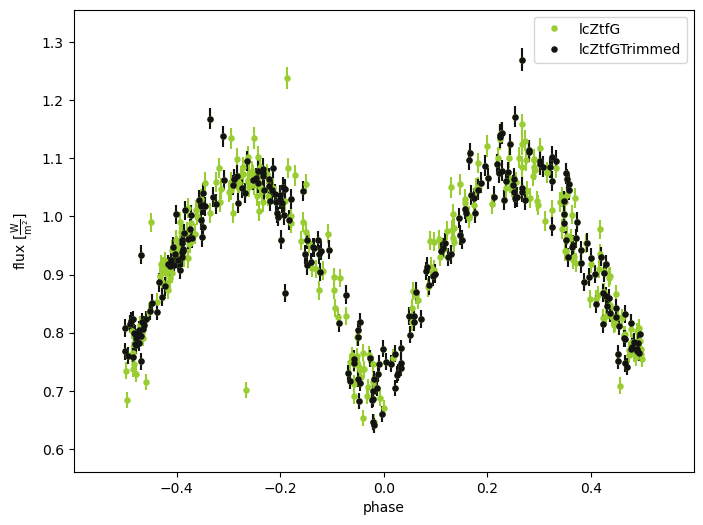

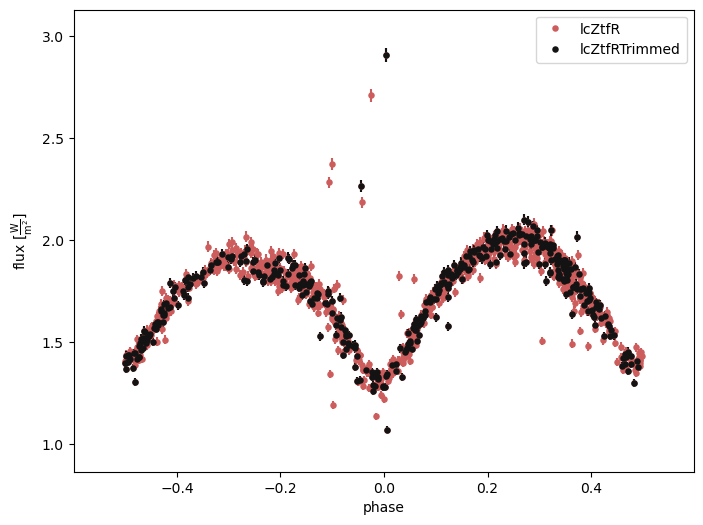

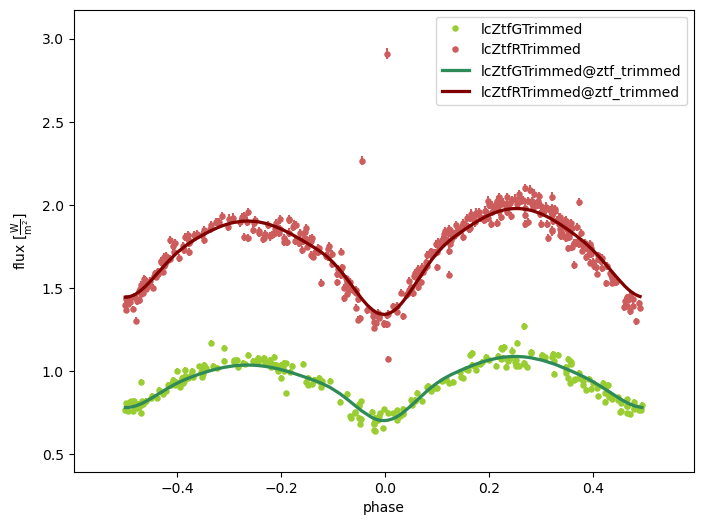

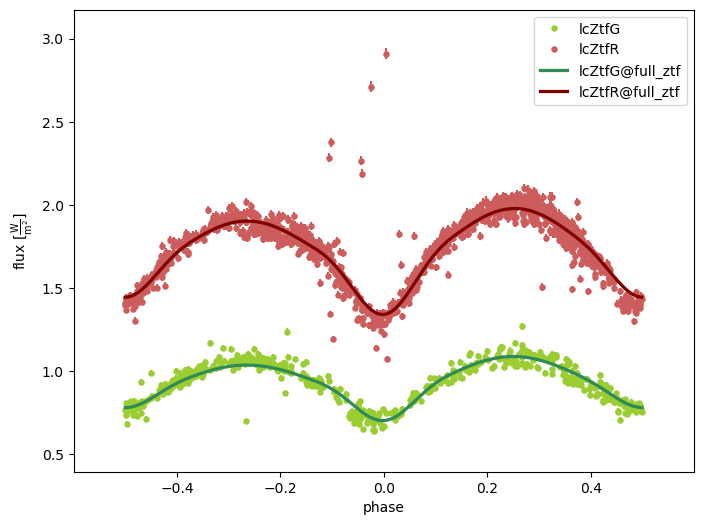

(<autofig.figure.Figure | 1 axes | 4 call(s)>,
 <Figure size 800x600 with 1 Axes>)

In [31]:
# comparing compute time
gen_utils.abilitateDatasets(b, trimmedZtfDatasets, False)
b.run_compute(model='ztf_trimmed', overwrite=True)

gen_utils.abilitateDatasets(b, ztfDatasets, False)
b.run_compute(model='full_ztf', overwrite=True)

# comparing completeness of dataset
b.plot(x='phase', dataset=['lcZtfG', 'lcZtfGTrimmed'], context='dataset', legend=True, show=True, marker='.', color=gen_utils.ZTF_PLOT_COLORS, s=0.015)
b.plot(x='phase', dataset=['lcZtfR', 'lcZtfRTrimmed'], context='dataset', legend=True, show=True, marker='.', color=gen_utils.ZTF_PLOT_COLORS, s=0.015)
b.plot(x='phase', dataset=['lcZtfRTrimmed', 'lcZtfGTrimmed'], model='ztf_trimmed', legend=True, show=True, marker={'dataset': '.'}, ls={'model': 'solid'}, color=gen_utils.ZTF_TRIMMED_PLOT_COLORS, s=0.015)
b.plot(x='phase', dataset=['lcZtfR', 'lcZtfG'], model='full_ztf', legend=True, show=True, marker={'dataset': '.'}, ls={'model': 'solid'}, color=gen_utils.ZTF_PLOT_COLORS, s=0.015)

In [21]:
# without taking into account secondary spot
exportSampler(b, sampler_solver='mcmc_ztf_trimmed', subfolder='iturbide-gaia-ztf-relative_norm', datasets=trimmedZtfDatasets,
			  init_from=['bounds_around', 'bounds_pblum_ztf_g_trimmed'], nwalkers=32, niters=500, progress_every_niters=50)
print(b['mcmc_ztf_trimmed'])

mcmc_ztf_trimmed | external-jobs/iturbide-gaia-ztf-relative_norm/mcmc_ztf_trimmed.py | results/mcmc_ztf_trimmed
ParameterSet: 15 parameters
   comments@mcmc_ztf_trimmed@s...: 
   use_server@mcmc_ztf_trimmed...: compute
   compute@mcmc_ztf_trimmed@so...: phoebe01
   continue_from@mcmc_ztf_trim...: None
   init_from@mcmc_ztf_trimmed@...: ['bounds_around', 'bounds_pblum_ztf_g_trimmed']
   init_from_combine@mcmc_ztf_...: first
   init_from_requires@mcmc_ztf...: ['limits', 'priors']
   priors@mcmc_ztf_trimmed@solver: []
   nwalkers@mcmc_ztf_trimmed@s...: 32
   niters@mcmc_ztf_trimmed@solver: 500
   burnin_factor@mcmc_ztf_trim...: 2.0
   thin_factor@mcmc_ztf_trimme...: 0.0
   nlags_factor@mcmc_ztf_trimm...: 3.0
   progress_every_niters@mcmc_...: 50
   expose_failed@mcmc_ztf_trim...: True


In [22]:
b.import_solution(fname="./external-jobs/iturbide-gaia-ztf-relative_norm/results/mcmc_ztf_trimmed", overwrite=True)

<ParameterSet: 23 parameters | qualifiers: fitted_units, nlags, imported_job, nwalkers, thin, samples, lnprob_cutoff, distributions_convert, niters, fitted_twigs, acceptance_fractions, adopt_values, lnprobabilities, comments, adopt_distributions, burnin, wrap_central_values, adopt_parameters, progress, fitted_uniqueids, distributions_bins, autocorr_times, failed_samples>

In [23]:
print(b['mcmc_ztf_trimmed_solution@autocorr_times']) # goal should be to have ~10x the number of samples of this
print(b['mcmc_ztf_trimmed_solution@nlags'])
print(b['mcmc_ztf_trimmed_solution@burnin'])

Parameter: autocorr_times@mcmc_ztf_trimmed_solution@solution
                       Qualifier: autocorr_times
                     Description: measured autocorrelation time with shape (len(fitted_twigs)) before applying burnin/thin.  To access with a custom burnin/thin, see phoebe.helpers.get_emcee_object_from_solution
                           Value: [52.70275666 47.26170903         nan 50.64975765 68.14752634 52.94591778]
                  Constrained by: 
                      Constrains: None
                      Related to: None

Parameter: nlags@mcmc_ztf_trimmed_solution@solution
                       Qualifier: nlags
                     Description: number of lags to use when computing/plotting the autocorrelation function.  If 0, will default to niters-burnin.
                           Value: 364
                  Constrained by: 
                      Constrains: None
                      Related to: None

Parameter: burnin@mcmc_ztf_trimmed_solution@solution
           

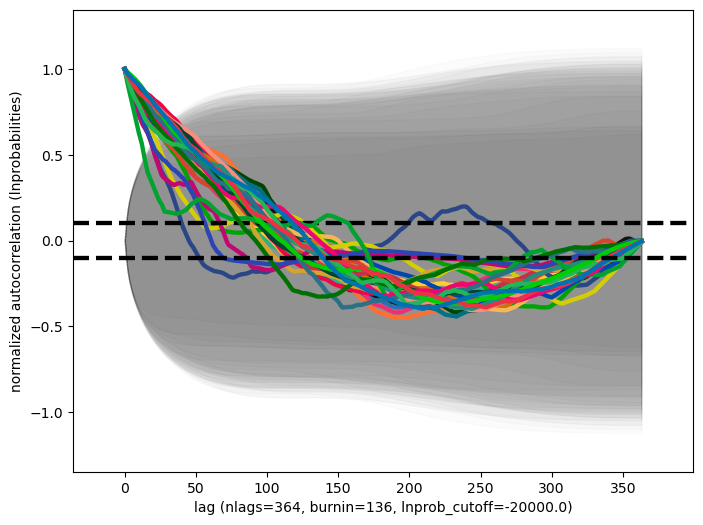

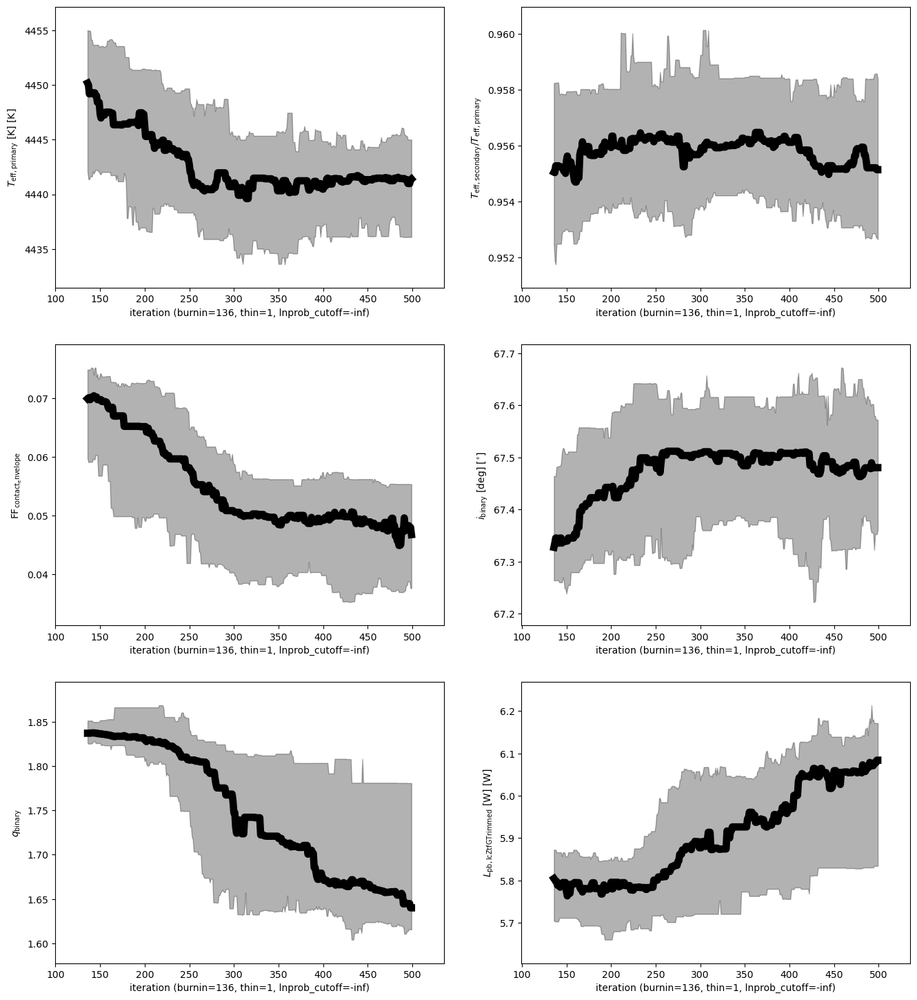

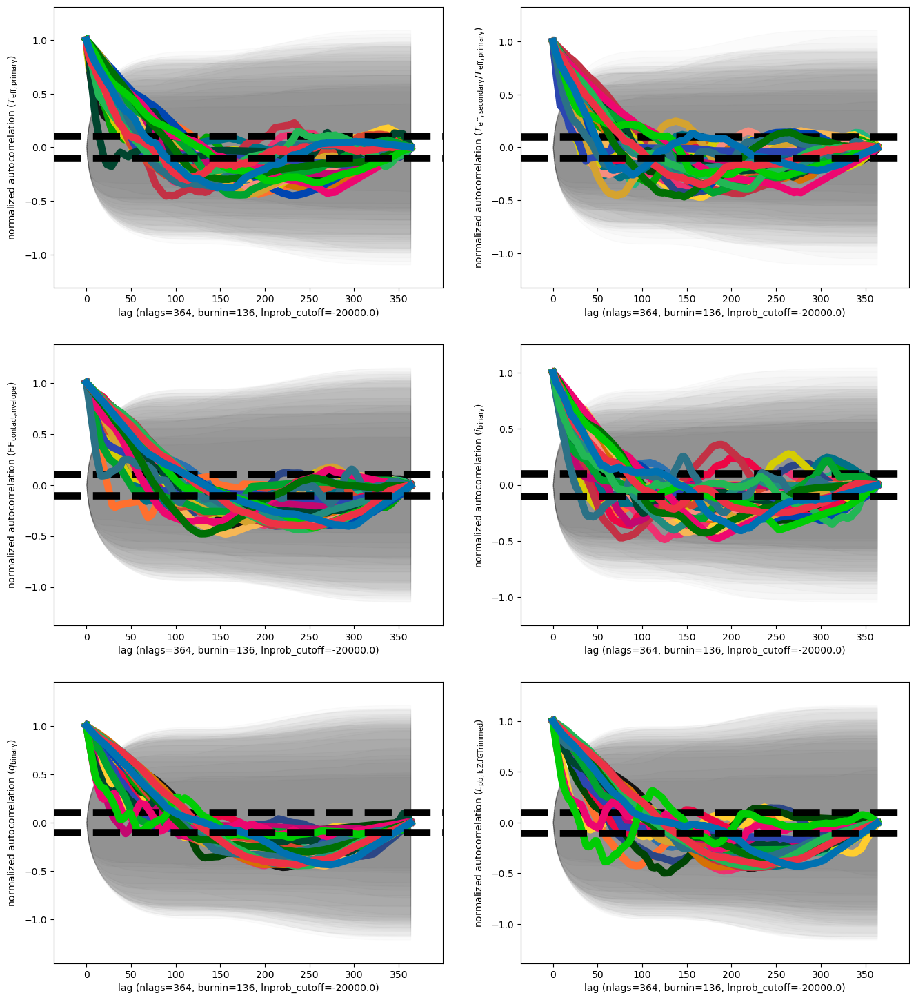

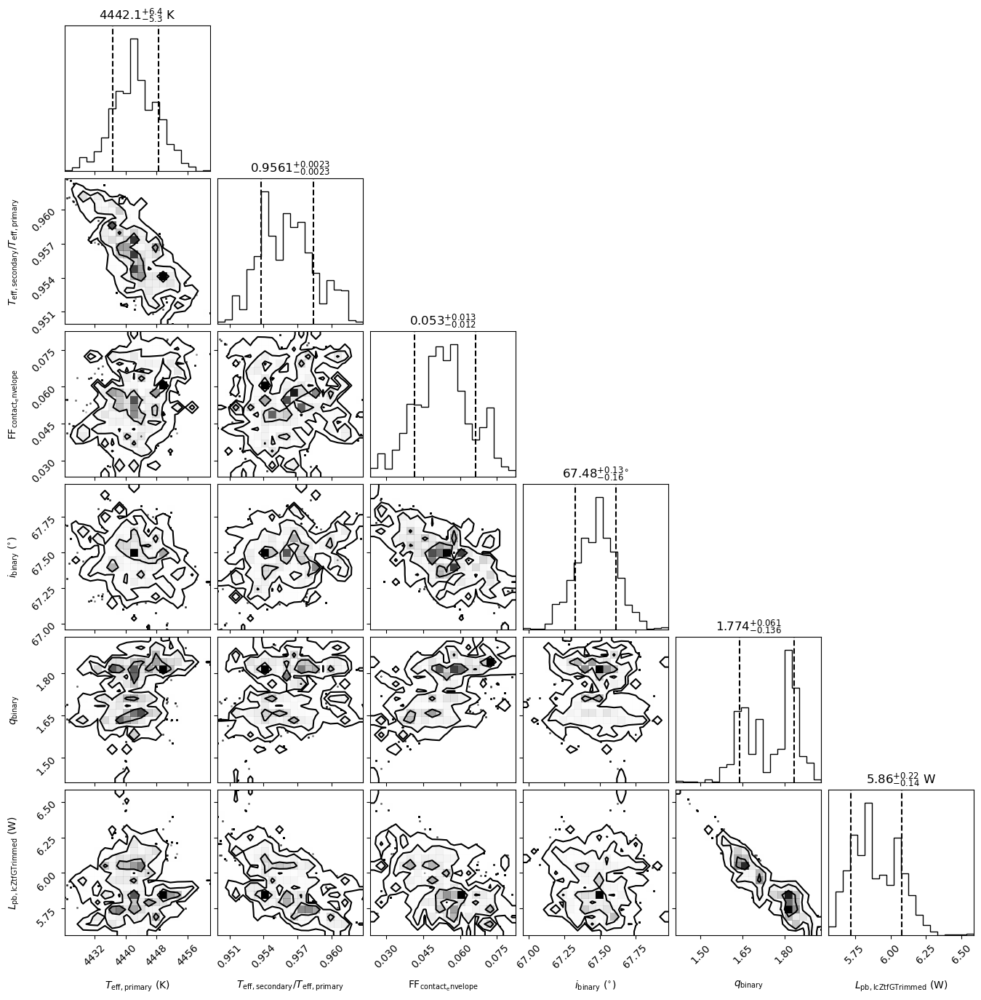

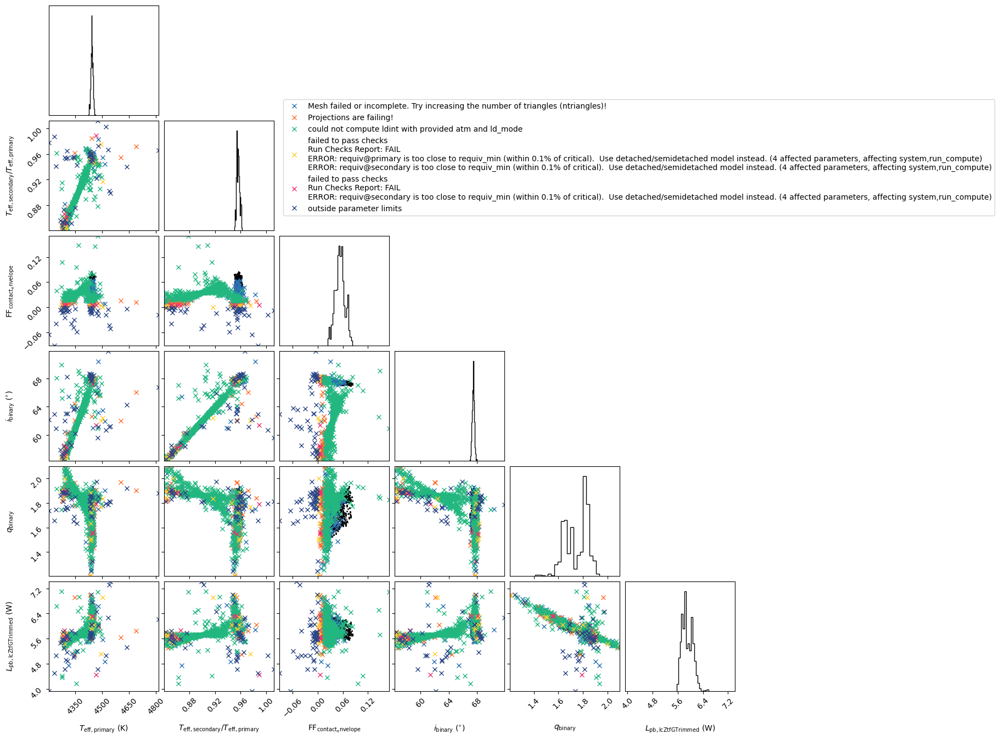

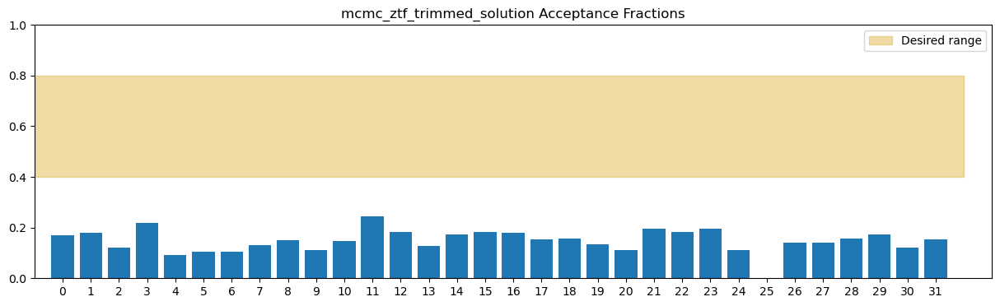

In [24]:
b.plot(solution='mcmc_ztf_trimmed_solution', style='acf_lnprobabilities', show=True, lnprob_cutoff=-20000)
b.plot(solution='mcmc_ztf_trimmed_solution', style='trace_spread', show=True)
b.plot(solution='mcmc_ztf_trimmed_solution', style='acf', show=True, lnprob_cutoff=-20000)
b.plot(solution='mcmc_ztf_trimmed_solution', style='corner', show=True)
b.plot(solution='mcmc_ztf_trimmed_solution', style='failed', show=True)
plotSamplerAcceptanceFractions(b, 'mcmc_ztf_trimmed_solution')

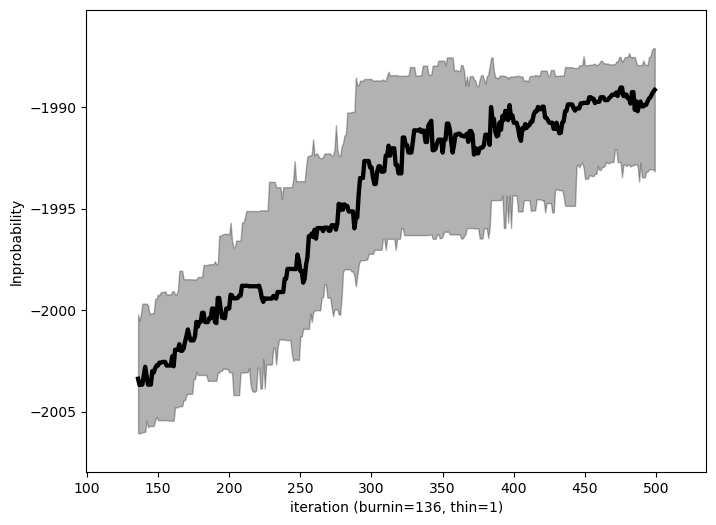

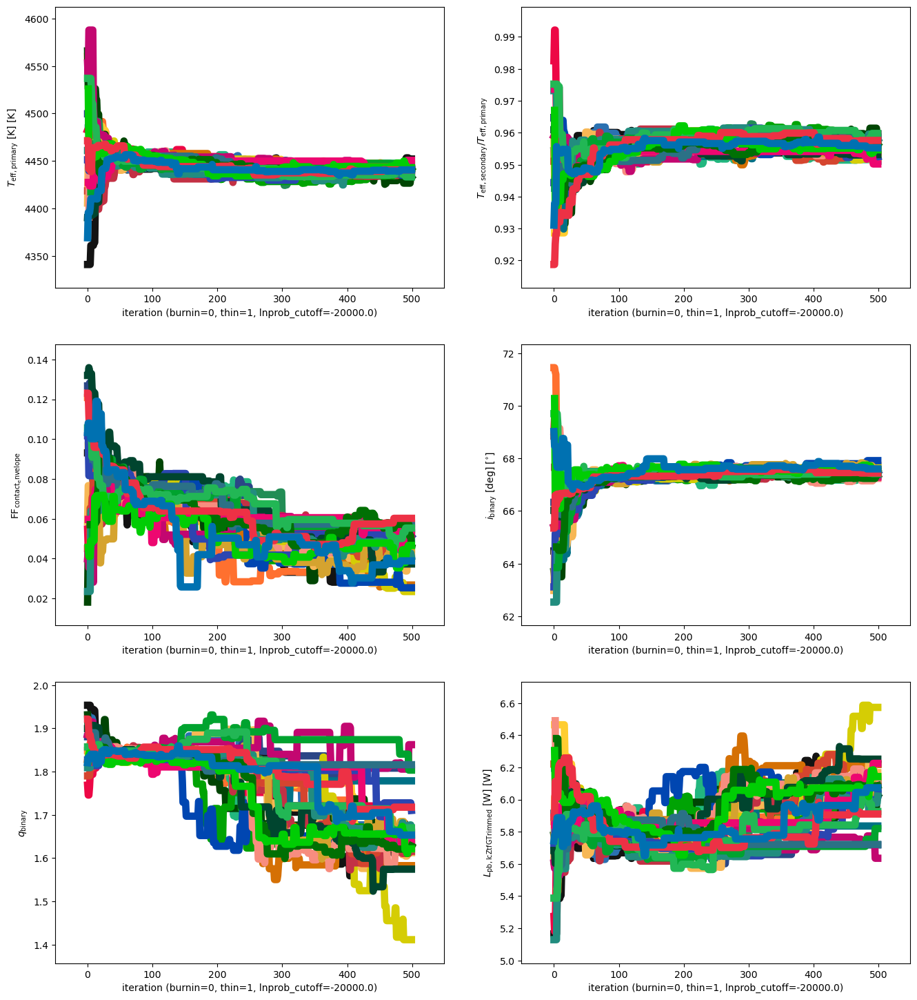

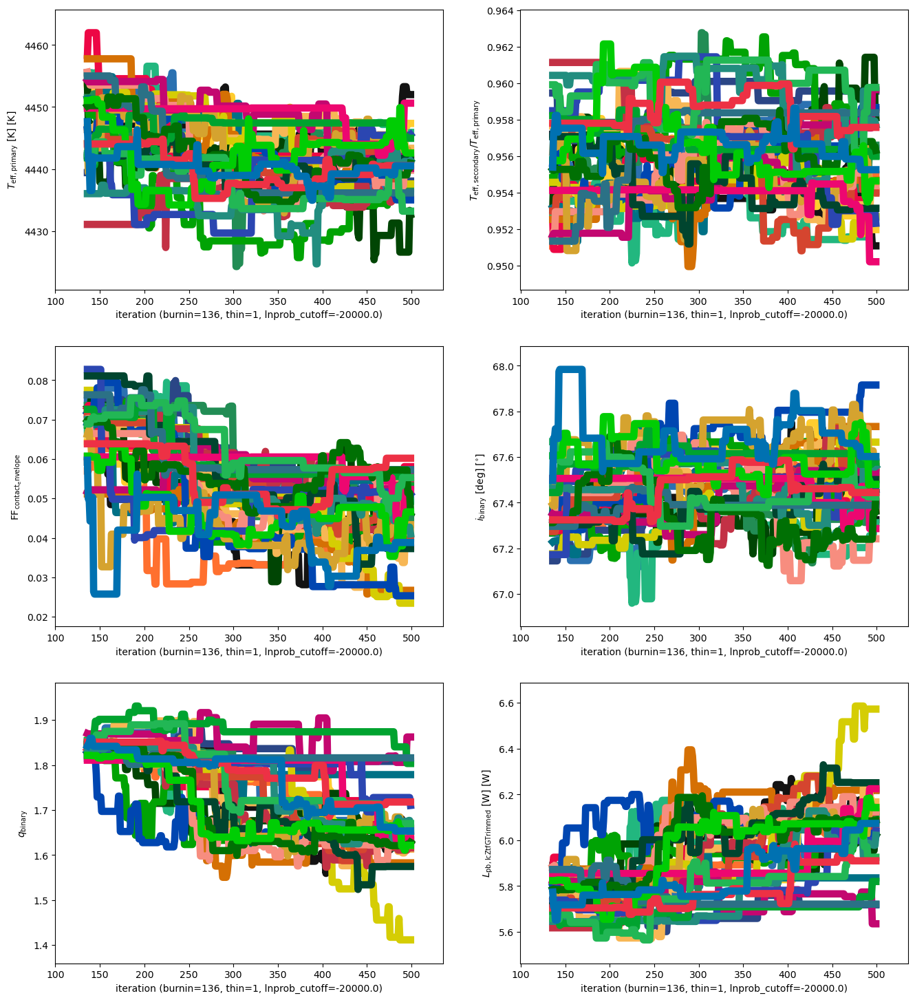

(<autofig.figure.Figure | 6 axes | 192 call(s)>,
 <Figure size 1600x1800 with 6 Axes>)

In [25]:
b.plot(solution='mcmc_ztf_trimmed_solution', style='lnprobabilities_spread', show=True)
b.plot(solution='mcmc_ztf_trimmed_solution', style='trace', show=True, burnin=0, lnprob_cutoff=-20000)
b.plot(solution='mcmc_ztf_trimmed_solution', style='trace', show=True, lnprob_cutoff=-20000)

### Adjusting `ntriangles` based on failed samples

In [ ]:
print(b['mcmc_ztf_trimmed_solution@fitted_twigs'])
# print(b['mcmc_ztf_trimmed_solution@failed_samples'])
print(b['ntriangles'])

In [ ]:
%%script echo "skipping; already ran analysis and arrived at 5700 for ntriangles. Setting value from the beginning"
from random import randint

b.set_value(qualifier='ntriangles', value=5700) # trial and error from randomly sampling the failed samples
sampleBundle = b.copy()

gen_utils.abilitateDatasets(sampleBundle, trimmedZtfDatasets)

sampledTwigs = sampleBundle.get_value(qualifier='fitted_twigs', solution='mcmc_ztf_trimmed_solution')
failedSamples = list(sampleBundle.get_value(qualifier='failed_samples', solution='mcmc_ztf_trimmed_solution').values())[0]
for i in range(5):
	for ii in range(3):
		fs = failedSamples[randint(0, len(failedSamples) - 1)]
		print(fs)
		for twig, value in zip(sampledTwigs, fs):
			sampleBundle.set_value(twig, value=value)
		
		try:
			res = sampleBundle.run_compute(model='failed_params', overwrite=True)
		except ValueError:
			print("Atmosphere error; acceptable to have, retrying with another sample")
			continue
		break

In [39]:
%%script echo "skipping; already ran prior analysis"
gen_utils.abilitateDatasets(b, trimmedZtfDatasets)
b.run_compute(model='latest', overwrite=True)
gen_utils.plotModelResidualsFigsize(b, figsize=(13, 7), model='latest', datasetGroups=[trimmedZtfDatasets])
gen_utils.animateMesh(b, logger, model='latest')

skipping; already ran prior analysis


### Trimmed Round 2

In [23]:
# b['mcmc_ztf_trimmed']
b.solutions
# print(b['mcmc_ztf_trimmed'])

['mcmc_ztf_trimmed_solution']

In [24]:
continueSampler(b, solver='mcmc_ztf_trimmed', prev_solution='mcmc_ztf_trimmed_solution', continuation_label='mcmc_ztf_trimmed_round2', 
				datasets=trimmedZtfDatasets, subfolder='iturbide-gaia-ztf-relative_norm', niters=500,
				comments=["Further trimmed ZTF:r dataset to only use a third of total data points, to compensate for having to increase ntriangles"])

mcmc_ztf_trimmed | external-jobs/iturbide-gaia-ztf-relative_norm/mcmc_ztf_trimmed_round2.py | results/mcmc_ztf_trimmed_round2_solution
